## Introduction 

 `La mobilité urbaine est un défi majeur dans les grandes villes, notamment à Abidjan, où le trafic routier connaît de fortes variations au cours de la  journée. Ces fluctuations ont un impact significatif sur la qualité de vie des habitants, les activités économiques et la planification urbaine.
Dans ce contexte, ce hackathon vise à développer un modèle prédictif capable d'estimer la vitesse moyenne du trafic au heures de pointe. Ce projet repose sur l’analyse et la  modélisation de données afin d’identifier les tendances et les facteurs déterminants qui influencent la fluidité du trafic. `

## importation des packages néccessaire a lanalyse

In [3]:
import pandas as pd
import numpy as np
import random
import os
from tqdm.notebook import tqdm
import ast
import plotly.express as px
import plotly.graph_objects as go
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import LineString
import folium
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
pd.options.display.float_format = '{:.5f}'.format
pd.options.display.max_rows = None
pd.options.display.max_columns = None
pd.options.display.max_colwidth = None

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

## Initialisation du set seed pour la reproductibilité des prédictions

In [5]:

SEED = 1999
random.seed(SEED)
np.random.seed(SEED)

## Importation des données Yandex néccessaire a lanalyse

In [7]:
definitions_des_variables = pd.read_csv(os.path.join('', 'VariableDefinitions.csv'))
definitions_des_variables.head()

,Name,English_Description,Description_en_francais
0,persistent_id,id of the road section,identifiant du segment de route
1,count_norm,normalized number of car trips,nombre normalisé de déplacements en voiture)
2,speed_avg,average speed (meters per second),vitesse moyenne des déplacements en mètres par seconde
3,"""first_weekday_""",First weekday,Lundi
4,"""first_weekday_00_""",first hour of the first day,premiere heure du Lundi


In [8]:
Donnée_entrainement = pd.read_csv(os.path.join('','Train.csv'))
Donnée_de_test = pd.read_csv(os.path.join('','Test.csv'))
Donnée_du_graph = pd.read_csv(os.path.join('','Graph.csv'))

In [10]:

print(Donnée_entrainement.info())
print(Donnée_de_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64973 entries, 0 to 64972
Columns: 165 entries, ID to target
dtypes: float64(162), object(3)
memory usage: 81.8+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13665 entries, 0 to 13664
Columns: 164 entries, ID to speed_avg_23_3_
dtypes: float64(161), object(3)
memory usage: 17.1+ MB
None


## Nos bases de données contiennent : 13665 ligne pour 164 colone pour la base de test car la variable cible a ete retirer et 64973 ligne et 165 colone pour la base d'entrainement et nous disposons aussi de donnée geographique pour l'eleboration de graphe routier.Nous utiliserons la base Train durant la suite de ce projet pour lelaboration du model jusqua la phase de test du model

In [16]:
Donnée_entrainement.describe(include = 'all')


,ID,persistent_id,day,prediction_type,count_norm_00_0_,count_norm_00_1_,count_norm_00_2_,count_norm_00_3_,count_norm_01_0_,count_norm_01_1_,count_norm_01_2_,count_norm_01_3_,count_norm_02_0_,count_norm_02_1_,count_norm_02_2_,count_norm_02_3_,count_norm_03_0_,count_norm_03_1_,count_norm_03_2_,count_norm_03_3_,count_norm_04_0_,count_norm_04_1_,count_norm_04_2_,count_norm_04_3_,count_norm_05_0_,count_norm_05_1_,count_norm_07_2_,count_norm_07_3_,count_norm_08_0_,count_norm_08_1_,count_norm_08_2_,count_norm_08_3_,count_norm_09_0_,count_norm_09_1_,count_norm_09_2_,count_norm_09_3_,count_norm_10_0_,count_norm_10_1_,count_norm_10_2_,count_norm_10_3_,count_norm_11_0_,count_norm_11_1_,count_norm_11_2_,count_norm_11_3_,count_norm_12_0_,count_norm_12_1_,count_norm_12_2_,count_norm_12_3_,count_norm_13_0_,count_norm_13_1_,count_norm_13_2_,count_norm_13_3_,count_norm_14_0_,count_norm_14_1_,count_norm_14_2_,count_norm_14_3_,count_norm_15_0_,count_norm_15_1_,count_norm_15_2_,count_norm_15_3_,count_norm_16_0_,count_norm_16_1_,count_norm_16_2_,count_norm_16_3_,count_norm_17_0_,count_norm_17_1_,count_norm_19_2_,count_norm_19_3_,count_norm_20_0_,count_norm_20_1_,count_norm_20_2_,count_norm_20_3_,count_norm_21_0_,count_norm_21_1_,count_norm_21_2_,count_norm_21_3_,count_norm_22_0_,count_norm_22_1_,count_norm_22_2_,count_norm_22_3_,count_norm_23_0_,count_norm_23_1_,count_norm_23_2_,count_norm_23_3_,speed_avg_00_0_,speed_avg_00_1_,speed_avg_00_2_,speed_avg_00_3_,speed_avg_01_0_,speed_avg_01_1_,speed_avg_01_2_,speed_avg_01_3_,speed_avg_02_0_,speed_avg_02_1_,speed_avg_02_2_,speed_avg_02_3_,speed_avg_03_0_,speed_avg_03_1_,speed_avg_03_2_,speed_avg_03_3_,speed_avg_04_0_,speed_avg_04_1_,speed_avg_04_2_,speed_avg_04_3_,speed_avg_05_0_,speed_avg_05_1_,speed_avg_07_2_,speed_avg_07_3_,speed_avg_08_0_,speed_avg_08_1_,speed_avg_08_2_,speed_avg_08_3_,speed_avg_09_0_,speed_avg_09_1_,speed_avg_09_2_,speed_avg_09_3_,speed_avg_10_0_,speed_avg_10_1_,speed_avg_10_2_,speed_avg_10_3_,speed_avg_11_0_,speed_avg_11_1_,speed_avg_11_2_,speed_avg_11_3_,speed_avg_12_0_,speed_avg_12_1_,speed_avg_12_2_,speed_avg_12_3_,speed_avg_13_0_,speed_avg_13_1_,speed_avg_13_2_,speed_avg_13_3_,speed_avg_14_0_,speed_avg_14_1_,speed_avg_14_2_,speed_avg_14_3_,speed_avg_15_0_,speed_avg_15_1_,speed_avg_15_2_,speed_avg_15_3_,speed_avg_16_0_,speed_avg_16_1_,speed_avg_16_2_,speed_avg_16_3_,speed_avg_17_0_,speed_avg_17_1_,speed_avg_19_2_,speed_avg_19_3_,speed_avg_20_0_,speed_avg_20_1_,speed_avg_20_2_,speed_avg_20_3_,speed_avg_21_0_,speed_avg_21_1_,speed_avg_21_2_,speed_avg_21_3_,speed_avg_22_0_,speed_avg_22_1_,speed_avg_22_2_,speed_avg_22_3_,speed_avg_23_0_,speed_avg_23_1_,speed_avg_23_2_,speed_avg_23_3_,target
count,64973,64973.00000,64973,64973,31820.00000,31779.00000,31688.00000,31653.00000,31522.00000,31508.00000,31384.00000,31318.00000,31092.00000,31013.00000,30847.00000,30601.00000,30622.00000,30688.00000,30563.00000,30400.00000,30440.00000,30631.00000,30820.00000,30842.00000,31099.00000,31386.00000,32274.00000,32313.00000,32283.00000,32290.00000,32326.00000,32311.00000,32347.00000,32367.00000,32399.00000,32381.00000,32350.00000,32363.00000,32363.00000,32385.00000,32381.00000,32385.00000,32382.00000,32400.00000,32356.00000,32379.00000,32376.00000,32373.00000,32385.00000,32377.00000,32381.00000,32378.00000,32369.00000,32373.00000,32365.00000,32359.00000,32319.00000,32330.00000,32332.00000,32349.00000,32357.00000,32346.00000,32346.00000,32327.00000,32295.00000,32311.00000,32232.00000,32213.00000,32209.00000,32223.00000,32195.00000,32182.00000,32146.00000,32159.00000,32149.00000,32124.00000,32139.00000,32040.00000,32065.00000,31962.00000,0.00000,0.00000,0.00000,0.00000,31820.00000,31779.00000,31688.00000,31653.00000,31522.00000,31508.00000,31384.00000,31318.00000,31092.00000,31013.00000,30847.00000,30601.00000,30622.00000,30688.00000,30563.00000,30400.00000,30440.00000,30631.00000,30820.00000,30842.00000,31099.00000,31386.00000,32274.00000,32313.00000,32283.00000,32290.00000,32326.00000,32311.00000

### Description des donnée 

les données d'entrainement nous donne exactement 64973 éléments a notre disposition 
Nous avons 7 jour unique au cours des quelles les analyses sont faites quotidienement 
Nous avons deux type de 2 type de prediction faisant reference au heure de pointe a savoir 6h et 18h
la vitesse moyenne pour la variable cible est 9.77713 avec un ecrart type de 4.05644 et un interval 
min max = [0.05251 , 37.90361]

# Interprétation de la ligne `top` dans le résumé statistique

La ligne **`top`** dans le tableau représente **la valeur la plus fréquente (le mode)** dans chaque colonne. Voici l'interprétation des colonnes du tableau :

## 1. Colonne `ID`  
- La valeur la plus fréquente est **`ID_2351954248757948416_X_first_weekday_X_morning_rush_hour`**.  
- Comme chaque valeur dans `ID` est unique (confirmé par `unique: 64973`), cela signifie que cette valeur apparaît **une seule fois** (`freq: 1`).  
- Cela est attendu pour une colonne contenant des identifiants uniques.

---

## 2. Colonne `persistant_id` 
- La valeur la plus fréquente sont les valeur manquantes
- sugerant qu'on a plus de valeur manquante que de valeurs reel
  
## 3. Colonne `day`  
- La valeur la plus fréquente est **`other_weekday`**.  
- Cela signifie que la majorité des données dans cette colonne concernent des jours qui ne sont pas explicitement nommés (comme samedi ou dimanche).  
- Cette catégorie regroupe probablement des jours standards (lundi-vendredi, sauf exceptions).

---

## 4. Colonne `prediction_type`  
- La valeur la plus fréquente est **`evening_rush_hour`**.  
- Cela indique que les prévisions concernent principalement des périodes de pointe en soirée.

---

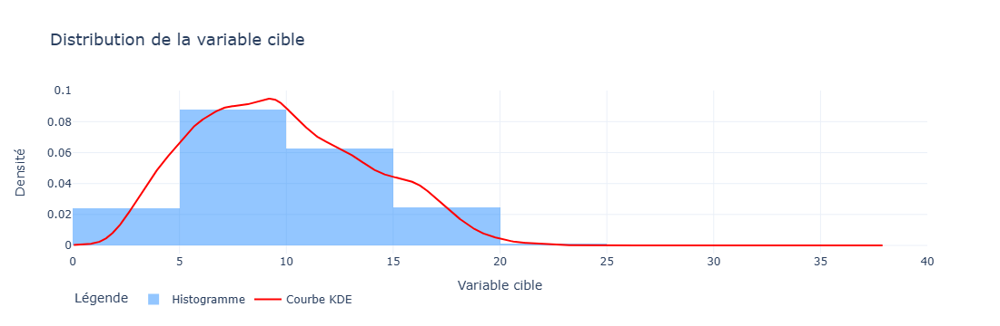

In [18]:
import plotly.graph_objects as go
import numpy as np
from scipy.stats import gaussian_kde

# Charger les données de la variable cible (remplacez par Donnée_entrainement['target'])
data = Donnée_entrainement['target']

# Calculer la densité KDE (Estimation de la densité)
kde = gaussian_kde(data)
x_range = np.linspace(min(data), max(data), 1000)  # Générer une plage de valeurs pour la courbe KDE
kde_values = kde(x_range)  # Calculer les densités correspondantes

# Créer la figure
fig = go.Figure()

# Ajouter l'histogramme
fig.add_trace(go.Histogram(
    x=data,
    nbinsx=15,  # Nombre de barres (bins)
    histnorm='probability density',  # Normaliser pour une densité de probabilité
    name='Histogramme',  # Nom dans la légende
    marker_color='rgba(0, 123, 255, 0.6)',  # Couleur bleue transparente
    opacity=0.7  # Transparence
))

# Ajouter la courbe KDE
fig.add_trace(go.Scatter(
    x=x_range,
    y=kde_values,
    mode='lines',
    name='Courbe KDE',  # Nom dans la légende
    line=dict(color='red', width=2)  # Style : ligne rouge épaisse
))

# Personnaliser l'apparence du graphique
fig.update_layout(
    title="Distribution de la variable cible",
    xaxis_title="Variable cible",  # Nom de l'axe des X
    yaxis_title="Densité",  # Nom de l'axe des Y
    template="plotly_white",  # Style clair
    title_font_size=18,  # Taille de la police du titre
    legend=dict(title="Légende", orientation="h", y=-0.2),  # Position et style de la légende
    xaxis=dict(showgrid=True, zeroline=False),  # Afficher la grille sur l'axe X
    yaxis=dict(showgrid=True, zeroline=False)   # Afficher la grille sur l'axe Y
)

# Afficher le graphique
fig.show()



### **Interprétation de la distribution de la variable cible :**

#### **1. Forme générale de la distribution :**
- La distribution semble **asymétrique à gauche** (asymétrie négative).
- La courbe KDE (rouge) montre un pic autour de **10**, ce qui suggère que la majorité des observations se situent dans cette plage de valeurs.
- Une queue plus longue à droite est visible, indiquant quelques valeurs plus élevées, mais elles sont rares.

#### **2. Histogramme :**
- L'histogramme (en bleu) représente la fréquence relative des observations dans des intervalles (bins).
- La plupart des données sont concentrées entre **5 et 15**, montrant une densité élevée dans cette plage.

#### **3. Densité et concentration :**
- La densité maximale (le sommet de la courbe KDE) est atteinte autour de **10**, ce qui indique que c'est la valeur centrale la plus courante dans la distribution.
- Les valeurs au-delà de **20** sont rares, indiquant une queue qui diminue rapidement.

#### **4. Données extrêmes :**
- La queue droite (vers 30-40) indique des valeurs élevées qui sont peu fréquentes mais présentes. Cela peut suggérer des outliers ou des cas exceptionnels.

#### **5. Résumé statistique probable :**
- **Moyenne :** Environ **10-12**, influencée par la concentration autour de cette zone.
- **Asymétrie :** Légèrement négative, indiquant que la majorité des données est située dans la partie basse de la plage avec une queue étendue à droite.
- **Dispersion :** La distribution semble modérément étalée, avec des observations dans une die pour comprendre leur origine.


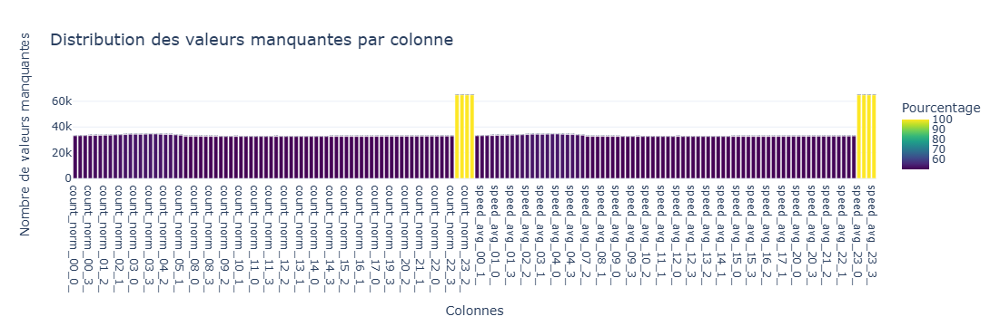

In [22]:
import pandas as pd
import plotly.express as px

# Calcul des valeurs manquantes par colonne
valeurs_manquantes = Donnée_entrainement.isnull().sum()

# Filtrer uniquement les colonnes ayant des valeurs manquantes
valeurs_manquantes = valeurs_manquantes[valeurs_manquantes > 0]

# Créer un DataFrame pour faciliter la visualisation
df_manquantes = pd.DataFrame({
    "Colonne": valeurs_manquantes.index,
    "Valeurs Manquantes": valeurs_manquantes.values,
    "Pourcentage": (valeurs_manquantes.values / len(Donnée_entrainement)) * 100
})

# Visualisation avec Plotly
fig = px.bar(
    df_manquantes,
    x="Colonne",
    y="Valeurs Manquantes",
    color="Pourcentage",
    text="Pourcentage",
    title="Distribution des valeurs manquantes par colonne",
    labels={"Valeurs Manquantes": "Nombre de valeurs manquantes", "Colonne": "Colonnes"},
    color_continuous_scale="Viridis"
)

# Ajout des labels pour rendre le graphique plus clair
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(
    xaxis_title="Colonnes",
    yaxis_title="Nombre de valeurs manquantes",
    title_font_size=18,
    template="plotly_white"
)

# Afficher le graphique
fig.show()


nous constatons que dans les quart heure entre 23h et 00h il a beaucoups de valeur manquante peut etre du au manque de conducteur nocture 


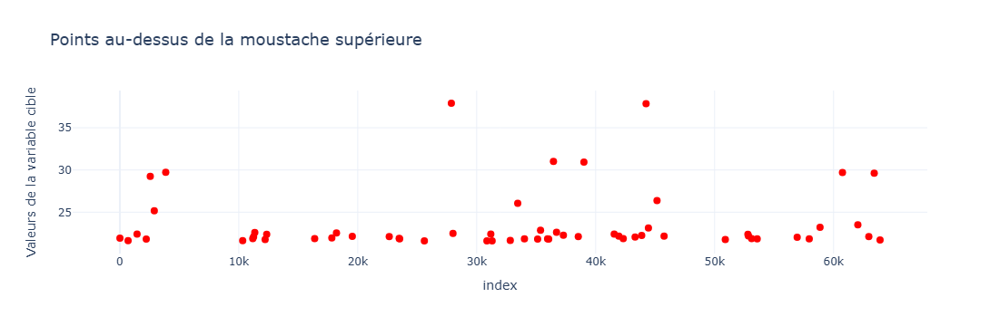

In [25]:
import plotly.express as px
import numpy as np
import pandas as pd

# Exemple de données : Variable cible (remplacez par Donnée_entrainement['target'])
data = Donnée_entrainement['target']

# Calculer les limites pour détecter les valeurs aberrantes
q1 = np.percentile(data, 25)  # Premier quartile (Q1)
q3 = np.percentile(data, 75)  # Troisième quartile (Q3)
iqr = q3 - q1  # Intervalle interquartile
upper_bound = q3 + 1.5 * iqr  # Limite supérieure

# Filtrer les points au-dessus de la moustache supérieure
outliers = data[data > upper_bound]


# Créer un DataFrame pour visualisation
df_outliers = pd.DataFrame({'Valeurs aberrantes': outliers})

# Créer le graphique avec Plotly
fig = px.scatter(
    df_outliers,
    y='Valeurs aberrantes',
    title="Points au-dessus de la moustache supérieure",
    labels={'Valeurs aberrantes': 'Valeurs aberrantes'},
)

# Personnalisation du graphique
fig.update_traces(marker=dict(color='red', size=8))  # Points rouges
fig.update_layout(
    yaxis_title="Valeurs de la variable cible",
    template="plotly_white",
    title_font_size=18,
)

# Afficher le graphique
fig.show()


# Interprétation du graphique

## Titre : Points au-dessus de la moustache supérieure

### Description générale
Le graphique représente les **valeurs de la variable cible** qui sont situées **au-dessus de la moustache supérieure** d’un boxplot (valeurs atypiques ou outliers). Chaque point rouge indique une observation où la valeur de la variable cible dépasse significativement les autres valeurs typiques dans les données.

### Axes
- **Axe des abscisses (index)** : Représente l'index des points dans le dataset, allant de 0 à environ 65,000 (nombre total d’observations).  
- **Axe des ordonnées (Valeurs de la variable cible)** : Montre les valeurs numériques de la variable cible, qui varient ici entre **25** et **35+**.

### Analyse
1. Les **outliers (valeurs atypiques)** sont clairement visibles comme des points isolés en rouge.
2. La majorité des outliers sont répartis de façon sporadique à travers l’ensemble des indices, ce qui peut indiquer qu’ils ne suivent pas une distribution ou un regroupement spécifique dans les données.
3. Ces observations dépassent la valeur maximale attendue définie par la moustache supérieuruvent être réalisées.


In [30]:
import ast
from shapely.geometry import LineString
import geopandas as gpd
import folium

# Convertir la colonne 'geometry' en tuples de coordonnées
Donnée_du_graph['geometry'] = Donnée_du_graph['geometry'].apply(
    lambda x: ast.literal_eval(x.replace(';', ',').replace('[', '(').replace(']', ')')) 
    if isinstance(x, str) else x
)

# Créer des objets LineString à partir des coordonnées des tuples
lignes = [LineString(coords) for coords in Donnée_du_graph['geometry']]

# Créer un GeoDataFrame en associant les objets LineString
gdf = gpd.GeoDataFrame(Donnée_du_graph, geometry=lignes)

# Calculer le centre de la carte en prenant la moyenne des centroids
centre_carte = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]
ma_carte = folium.Map(location=centre_carte, zoom_start=11)

# Ajouter chaque objet LineString à la carte
for _, ligne in gdf.iterrows():
    folium.GeoJson(ligne['geometry']).add_to(ma_carte)

train_copy = Donnée_entrainement[['persistent_id', 'target']]
train_copy ['dataset'] = 'train'
test_copy = Donnée_de_test[['persistent_id']]
test_copy ['dataset'] = 'test'
train_test = pd.concat([train_copy, test_copy])
new_gdf = gdf.merge(train_test[['persistent_id', 'target', 'dataset']], how = 'left', on = ['persistent_id'])
new_gdf.head(2)
new_gdf.toponym.value_counts(normalize = True).head()


toponym
Boulevard Latrille                 0.05524
Boulevard Phillipe Grégoire Yacé   0.04954
Autoroute du Nord                  0.03980
Avenue Fologo Laurent Dona         0.03873
Boulevard du Port                  0.03667
Name: proportion, dtype: float64

In [31]:

Boulevard = new_gdf[new_gdf.toponym == 'Boulevard du Port']

# Create a Folium map centered at a specific location
# Créer une carte Folium centrée sur un emplacement spécifique
map_center = [Boulevard.geometry.centroid.y.mean(), Boulevard.geometry.centroid.x.mean()]
ma_carte = folium.Map(location=map_center, zoom_start=15)

# Iterate through the GeoDataFrame and add LineString objects to the map
# Parcourez le GeoDataFrame et ajoutez des objets LineString à la carte
for idx, row in Boulevard.iterrows():
    folium.GeoJson(row['geometry'], style_function=lambda feature: {'weight': 5}).add_to(ma_carte)

# Display the map
# Montrer la carte
ma_carte

In [33]:
Boulevard = new_gdf[new_gdf.toponym == 'Boulevard Phillipe Grégoire Yacé']
map_center = [Boulevard.geometry.centroid.y.mean(), Boulevard.geometry.centroid.x.mean()]
ma_carte = folium.Map(location=map_center, zoom_start=15)

# Parcourez le GeoDataFrame et ajoutez des objets LineString à la carte
for idx, row in Boulevard.iterrows():
    folium.GeoJson(row['geometry'], style_function=lambda feature: {'weight': 5}).add_to(ma_carte)

# Montrer la carte
ma_carte

In [34]:
train_graph = Donnée_entrainement.merge(Donnée_du_graph, how = 'left', on = 'persistent_id')
train_graph.toponym.head()

0                  Rue des Jardins
1    Boulevard Hortense Aka Anghui
2                     Avenue Carde
3                    Ancien Lavage
4                              NaN
Name: toponym, dtype: object

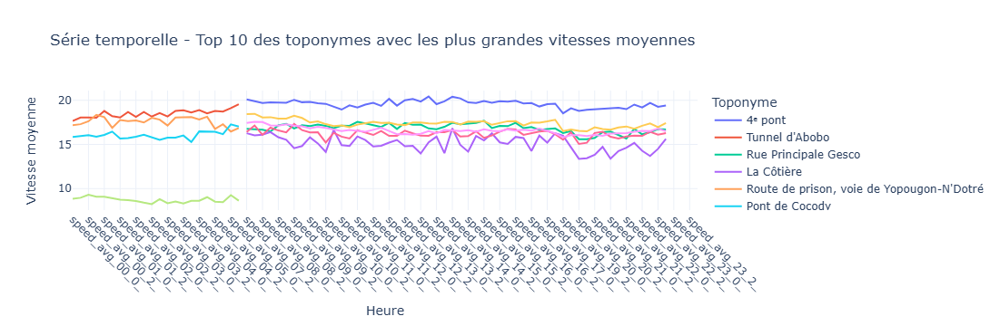

In [36]:
import plotly.graph_objects as go

# Filtrer les toponymes non NaN
toponymes = train_graph['toponym'].dropna().unique()

# Calculer la moyenne des vitesses pour chaque toponyme
vitesse_columns = [col for col in train_graph.columns if col.startswith('speed_avg')]
mean_vitesse_per_toponyme = (
    train_graph.groupby('toponym')[vitesse_columns].mean().mean(axis=1)
)

# Sélectionner les 10 toponymes avec les moyennes les plus élevées
top_10_toponymes = mean_vitesse_per_toponyme.nlargest(10).index

# Création de la figure
fig = go.Figure()

# Boucle pour tracer les 10 meilleurs toponymes
for toponyme in top_10_toponymes:
    # Filtrer les données pour le toponyme courant
    Autoroute_road = train_graph[train_graph.toponym == toponyme]
    Autoroute = Autoroute_road[Autoroute_road.day == 'other_holiday'][
        [x for x in Autoroute_road.columns if x.startswith('speed_avg')]
    ].T.reset_index().iloc[:, :3]
    
    # Vérifier si les données sont disponibles
    if Autoroute.empty:
        continue
    
    # Renommer les colonnes
    Autoroute.columns = ['heure', 'pic_matinal', 'pic_soir']
    
    # Ajouter une trace pour le toponyme courant
    fig.add_trace(go.Scatter(
        x=Autoroute['heure'],
        y=Autoroute['pic_matinal'],
        mode='lines',
        name=toponyme,
        line=dict(width=2)
    ))

# Mise à jour du layout
fig.update_layout(
    title="Série temporelle - Top 10 des toponymes avec les plus grandes vitesses moyennes",
    xaxis_title="Heure",
    yaxis_title="Vitesse moyenne",
    xaxis=dict(tickangle=45),
    legend_title="Toponyme",
    template="plotly_white"
)

# Affichage de la figure
fig.show()


### Interprétation de la Série Temporelle des Vitesses Moyennes

#### Contexte
Ce graphique présente les séries temporelles des 10 toponymes ayant les plus grandes vitesses moyennes. Les données sont tracées en fonction de l'heure de la journée, et chaque ligne représente un toponyme spécifique.

#### Analyse
1. **Les toponymes principaux :**
   - Les 10 toponymes affichés incluent des lieux tels que "4ᵉ pont", "Tunnel d'Abobo", "Rue Principale Gesco", etc.
   - Ces toponymes sont ceux où les vitesses moyennes sont les plus élevées parmi tous les emplacements analysés.

2. **Tendance des vitesses :**
   - Les vitesses moyennes varient légèrement au fil des heures, avec certaines fluctuations notables pour certains toponymes.
   - Le "4ᵉ pont" semble maintenir une vitesse moyenne supérieure à 20, tandis que d'autres zones comme la "Rue Principale Gesco" oscillent autour de 15-18.

3. **Comparaison entre toponymes :**
   - Les lignes permettent de comparer directement les vitesses moyennes entre les différents toponymes.
   - Certains emplacements montrent des variations plus importantes dans la vitesse moyenne, suggérant des conditions plus fluctuantes (trafic, perturbations).

#### Conclusion
Ce graphique met en évidence les zones où les véhicules circulent à des vitesses relativement élevées. Cela pourrait indiquer des routes principales ou des zones avec un trafic fluide. Ces informations peuvent être utilisées pour optimiser la gestion du trafic ou pour cibler des interventions spécifiques.


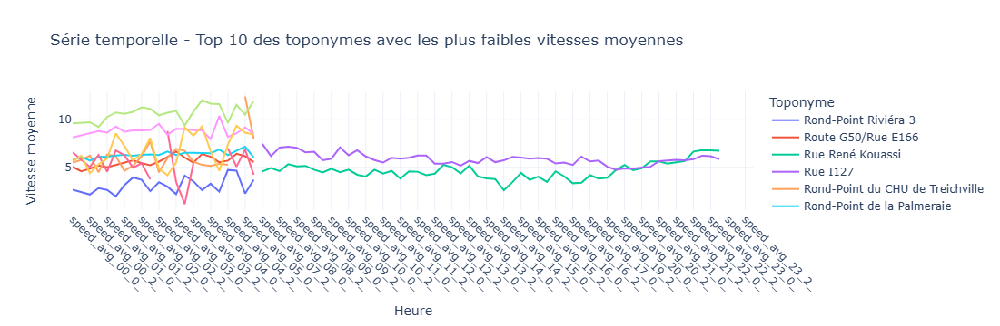

In [41]:
import plotly.graph_objects as go

# Filtrer les toponymes non NaN
toponymes = train_graph['toponym'].dropna().unique()

# Calculer la moyenne des vitesses pour chaque toponyme
vitesse_columns = [col for col in train_graph.columns if col.startswith('speed_avg')]
mean_vitesse_per_toponyme = (
    train_graph.groupby('toponym')[vitesse_columns].mean().mean(axis=1)
)

# Sélectionner les 10 toponymes avec les moyennes les plus basses
bottom_10_toponymes = mean_vitesse_per_toponyme.nsmallest(10).index

# Création de la figure
fig = go.Figure()

# Boucle pour tracer les 10 derniers toponymes
for toponyme in bottom_10_toponymes:
    # Filtrer les données pour le toponyme courant
    Autoroute_road = train_graph[train_graph.toponym == toponyme]
    Autoroute = Autoroute_road[Autoroute_road.day == 'other_holiday'][
        [x for x in Autoroute_road.columns if x.startswith('speed_avg')]
    ].T.reset_index().iloc[:, :3]
    
    # Vérifier si les données sont disponibles
    if Autoroute.empty:
        continue
    
    # Renommer les colonnes
    Autoroute.columns = ['heure', 'pic_matinal', 'pic_soir']
    
    # Ajouter une trace pour le toponyme courant
    fig.add_trace(go.Scatter(
        x=Autoroute['heure'],
        y=Autoroute['pic_matinal'],
        mode='lines',
        name=toponyme,
        line=dict(width=2)
    ))

# Mise à jour du layout
fig.update_layout(
    title="Série temporelle - Top 10 des toponymes avec les plus faibles vitesses moyennes",
    xaxis_title="Heure",
    yaxis_title="Vitesse moyenne",
    xaxis=dict(tickangle=45),
    legend_title="Toponyme",
    template="plotly_white"
)

# Affichage de la figure
fig.show()


### Interprétation de la Série Temporelle des Vitesses Moyennes (Toponymes les Plus Lents)

#### Contexte
Ce graphique illustre les séries temporelles des 10 toponymes ayant les vitesses moyennes les plus faibles. Les données sont représentées par des lignes pour chaque toponyme, et les vitesses sont affichées en fonction de l'heure.

#### Analyse
1. **Les toponymes principaux :**
   - Les 10 toponymes ayant les plus faibles vitesses moyennes incluent des emplacements tels que :
     - **Rond-Point Rivière 3**
     - **Route G50/Rue E166**
     - **Rue René Kouassi**
     - **Rond-Point du CHU de Treichville**
     - **Rond-Point de la Palmeraie**
   - Ces zones montrent des vitesses moyennes nettement inférieures à celles observées dans les toponymes les plus rapides.

2. **Tendance des vitesses :**
   - Les vitesses moyennes restent majoritairement en dessous de **10 km/h**, certaines descendant même à environ **5 km/h**.
   - Des fluctuations importantes sont visibles dans certaines zones, ce qui pourrait indiquer des perturbations ou un trafic dense.

3. **Comparaison entre toponymes :**
   - **Rue René Kouassi** et **Rond-Point de la Palmeraie** semblent avoir des vitesses moyennes plus stables.
   - À l'inverse, des lieux comme **Route G50/Rue E166** montrent des variations marquées au fil des heures, indiquant des conditions de circulation plus imprévisibles.

4. **Implications :**
   - Les vitesses moyennes faibles peuvent être dues à divers facteurs comme le trafic, les feux de signalisation, ou des infrastructures inadaptées.
   - Ces informations pourraient être utilisées pour cibler des améliorations spécifiques dans ces zones.

#### Conclusion
Ce graphique met en lumière les zones problématiques en termes de fluidité du trafic. Les toponymes identifiés pourraient être des priorités pour des interventions telles que des optimisations de feux de circulation ou des élargissements de voies.


In [44]:
# Nombre total de valeurs dans le DataFrame
total_values = Donnée_entrainement.size

# Nombre total de valeurs manquantes
missing_values = Donnée_entrainement.isnull().sum().sum()

# Calcul du pourcentage total de valeurs manquantes
percentage_missing = (missing_values / total_values) * 100

# Affichage du résultat
print(f"Pourcentage total de valeurs manquantes : {percentage_missing:.2f}%")


Pourcentage total de valeurs manquantes : 51.68%


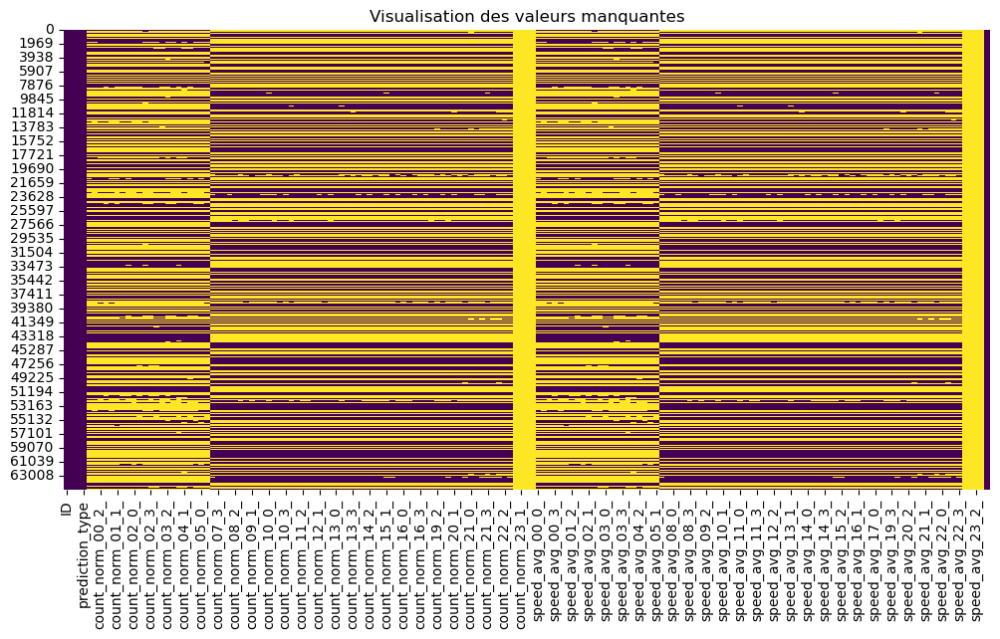

In [46]:

# Distribution des valeurs manquantes par ligne
missing_values_per_row = Donnée_entrainement.isnull().sum(axis=1)
missing_percentage_per_row = (missing_values_per_row / Donnée_entrainement.shape[1]) * 100

import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap des valeurs manquantes
plt.figure(figsize=(12, 6))
sns.heatmap(Donnée_entrainement.isnull(), cbar=False, cmap="viridis")
plt.title("Visualisation des valeurs manquantes")
plt.show()

# Colonnes avec des valeurs manquantes
missing_summary = Donnée_entrainement.isnull().mean().sort_values(ascending=False)



nous allons retirer 23h et ces different quart dheure car ils contiennet 100% de valeur manquante

In [48]:
# Supprimer les colonnes avec 100 % de valeurs manquantes
Donnée_entrainement = Donnée_entrainement.dropna(axis=1, how='all')
Donnée_de_test = Donnée_de_test.dropna(axis=1,how='all')

# Vérification après suppression
print(f"Nombre de colonnes après suppression : {Donnée_entrainement.shape[1]}")
print(f"Nombre de colonnes après suppression : {Donnée_de_test.shape[1]}")



Nombre de colonnes après suppression : 157
Nombre de colonnes après suppression : 156


In [49]:
import pandas as pd

# Supprimer les colonnes avec 100 % de valeurs manquantes
Donnée_entrainement = Donnée_entrainement.dropna(axis=1, how='all')

# Étape 1 : Calculer le pourcentage de valeurs manquantes pour chaque ligne
Donnée_entrainement["missing_percentage"] = Donnée_entrainement.isnull().mean(axis=1)

# Étape 2 : Identifier les lignes correspondant aux 25 % les plus manquantes
threshold = Donnée_entrainement["missing_percentage"].quantile(0.75)

# Supprimer les 25 % des lignes les plus manquantes
Donnée_entrainement = Donnée_entrainement[Donnée_entrainement["missing_percentage"] <= threshold]

# Supprimer la colonne temporaire 'missing_percentage'
Donnée_entrainement = Donnée_entrainement.drop(columns=["missing_percentage"])

# Étape 3 : Remplacer les valeurs manquantes par la médiane de chaque heure
for col in Donnée_entrainement.columns:
    if Donnée_entrainement[col].isnull().any():  # Vérifier si la colonne a des valeurs manquantes
        median_value = Donnée_entrainement[col].median()
        Donnée_entrainement[col] = Donnée_entrainement[col].fillna(median_value)

# Vérification
print(f"Nombre de colonnes après traitement : {Donnée_entrainement.shape[1]}")
print(f"Nombre de lignes après traitement : {Donnée_entrainement.shape[0]}")




Nombre de colonnes après traitement : 157
Nombre de lignes après traitement : 59842


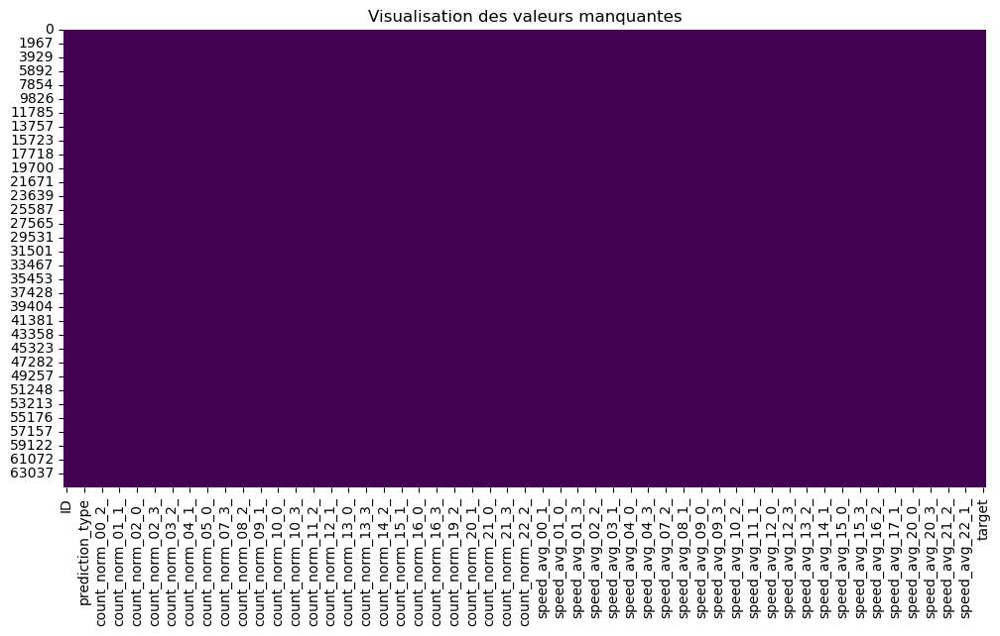

In [50]:
# Distribution des valeurs manquantes par ligne
missing_values_per_row = Donnée_entrainement.isnull().sum(axis=1)
missing_percentage_per_row = (missing_values_per_row / Donnée_entrainement.shape[1]) * 100

import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap des valeurs manquantes
plt.figure(figsize=(12, 6))
sns.heatmap(Donnée_entrainement.isnull(), cbar=False, cmap="viridis")
plt.title("Visualisation des valeurs manquantes")
plt.show()

# Colonnes avec des valeurs manquantes
missing_summary = Donnée_entrainement.isnull().mean().sort_values(ascending=False)


Le graphique montre une abscence total de valeur manquantes 

In [90]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Supposons que Donnée_entrainement contienne toutes les données nécessaires
# Suppression des colonnes inutiles pour l'entraînement
X = Donnée_entrainement.drop(['ID', 'persistent_id', 'day', 'prediction_type', 'target'], axis=1).fillna(0)

# Cible (variable à prédire)
y = Donnée_entrainement['target']

# Découpage des données entre ensemble d'apprentissage et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialisation du modèle
clf = RandomForestRegressor(n_estimators = 65,random_state=42,n_jobs=-1)

# Entraînement du modèle
clf.fit(X_train, y_train)

# Prédictions sur l'ensemble de test
y_pred = clf.predict(X_test)

# Évaluation de la performance avec RMSE
rmse_score = mean_squared_error(y_test, y_pred, squared=False)
print(f'RMSE Score: {rmse_score}')

p = rmse_score/y_pred.mean()
p


RMSE Score: 0.9628818353301575


0.09793295529896312

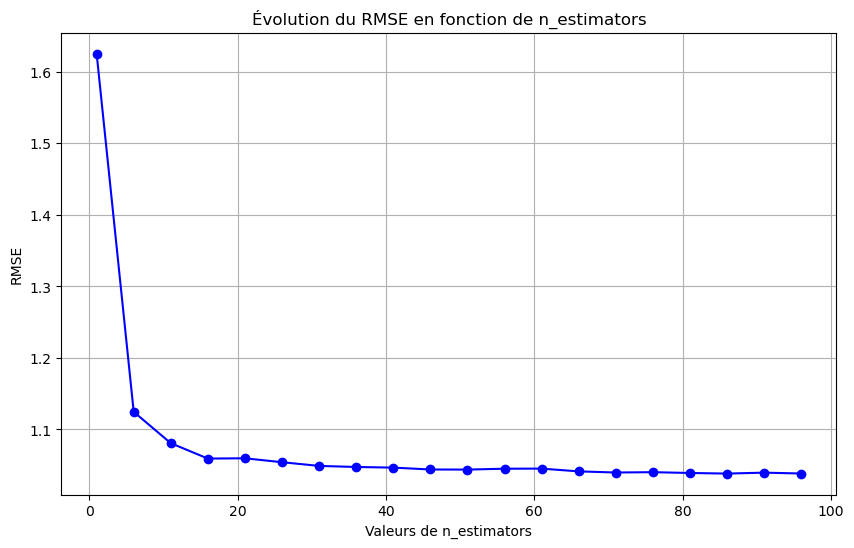

In [132]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

def plot_rmse_evolution(X, y, param_name, param_values):
    """
    Affiche l'évolution du RMSE en fonction des valeurs d'un hyperparamètre.

    Parameters:
    - X: DataFrame ou array des features.
    - y: Array ou Series des cibles.
    - param_name: Nom de l'hyperparamètre à tester (string, ex. 'n_estimators').
    - param_values: Liste des valeurs à tester pour l'hyperparamètre.
    """
    rmse_scores = []

    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Tester chaque valeur de l'hyperparamètre
    for value in param_values:
        params = {param_name: value}
        clf = RandomForestRegressor(**params, random_state=42, n_jobs=-1)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        rmse_scores.append(rmse)

    # Plot des résultats
    plt.figure(figsize=(10, 6))
    plt.plot(param_values, rmse_scores, marker='o', linestyle='-', color='blue')
    plt.title(f"Évolution du RMSE en fonction de {param_name}")
    plt.xlabel(f"Valeurs de {param_name}")
    plt.ylabel("RMSE")
    plt.grid()
    plt.show()

param_values = np.arange(1, 100, 5).tolist()
plot_rmse_evolution(X_train, y_train, param_name='n_estimators', param_values=param_values)


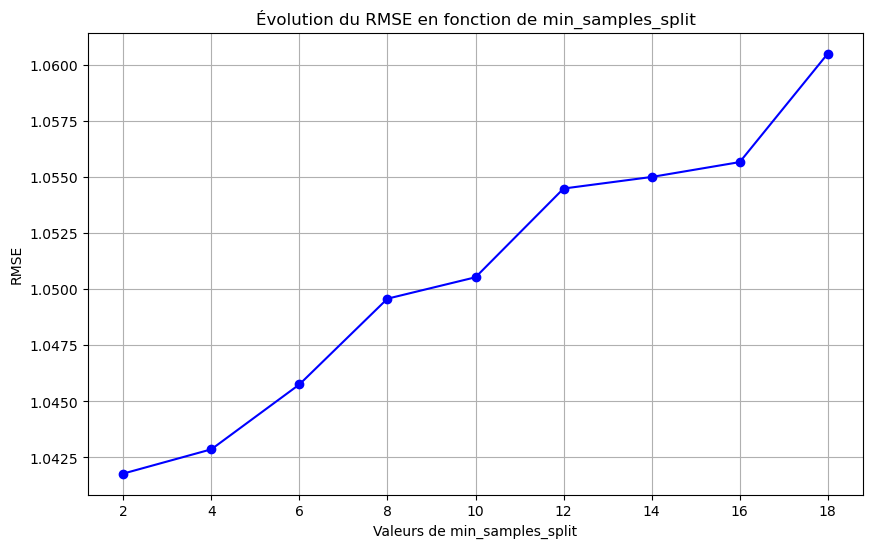

In [134]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

def plot_rmse_evolution(X, y, param_name, param_values):
    """
    Affiche l'évolution du RMSE en fonction des valeurs d'un hyperparamètre.

    Parameters:
    - X: DataFrame ou array des features.
    - y: Array ou Series des cibles.
    - param_name: Nom de l'hyperparamètre à tester (string, ex. 'n_estimators').
    - param_values: Liste des valeurs à tester pour l'hyperparamètre.
    """
    rmse_scores = []

    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Tester chaque valeur de l'hyperparamètre
    for value in param_values:
        params = {param_name: value, 'n_estimators': 65}
        clf = RandomForestRegressor(**params, random_state=42, n_jobs=-1)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        rmse_scores.append(rmse)

    # Plot des résultats
    plt.figure(figsize=(10, 6))
    plt.plot(param_values, rmse_scores, marker='o', linestyle='-', color='blue')
    plt.title(f"Évolution du RMSE en fonction de {param_name}")
    plt.xlabel(f"Valeurs de {param_name}")
    plt.ylabel("RMSE")
    plt.grid()
    plt.show()
    

param_values = np.arange(2, 20, 2).tolist()
plot_rmse_evolution(X_train, y_train, param_name='min_samples_split', param_values=param_values)


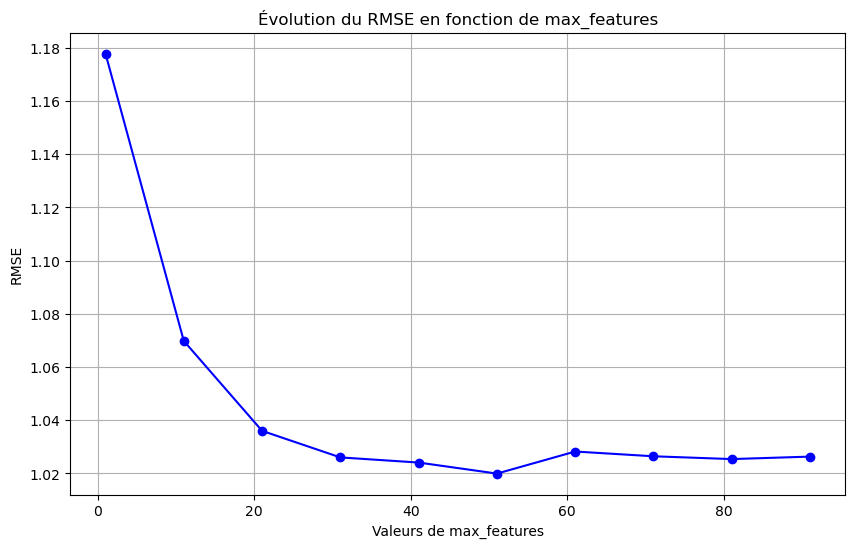

In [140]:
def plot_rmse_evolution(X, y, param_name, param_values):
    """
    Affiche l'évolution du RMSE en fonction des valeurs d'un hyperparamètre.

    Parameters:
    - X: DataFrame ou array des features.
    - y: Array ou Series des cibles.
    - param_name: Nom de l'hyperparamètre à tester (string, ex. 'n_estimators').
    - param_values: Liste des valeurs à tester pour l'hyperparamètre.
    """
    rmse_scores = []

    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Tester chaque valeur de l'hyperparamètre
    for value in param_values:
        params = {param_name: value, 'n_estimators': 65,'min_samples_split':2 }
        clf = RandomForestRegressor(**params, random_state=42, n_jobs=-1):
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        rmse_scores.append(rmse)

    # Plot des résultats
    plt.figure(figsize=(10, 6))
    plt.plot(param_values, rmse_scores, marker='o', linestyle='-', color='blue')
    plt.title(f"Évolution du RMSE en fonction de {param_name}")
    plt.xlabel(f"Valeurs de {param_name}")
    plt.ylabel("RMSE")
    plt.grid()
    plt.show()
    
param_values = np.arange(1, 100, 10).tolist()  # Liste des valeurs de max_features
plot_rmse_evolution(X_train, y_train, param_name='max_features', param_values=param_values)


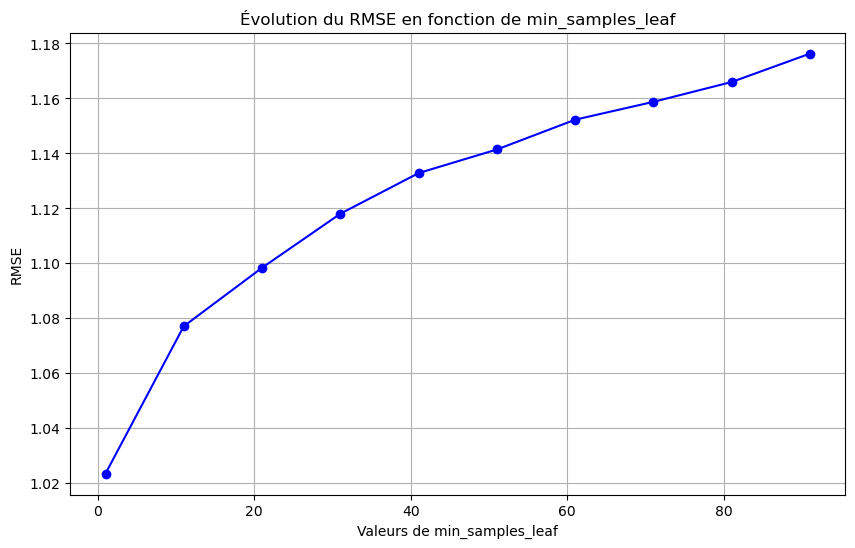

In [144]:
def plot_rmse_evolution(X, y, param_name, param_values):
    """
    Affiche l'évolution du RMSE en fonction des valeurs d'un hyperparamètre.

    Parameters:
    - X: DataFrame ou array des features.
    - y: Array ou Series des cibles.
    - param_name: Nom de l'hyperparamètre à tester (string, ex. 'n_estimators').
    - param_values: Liste des valeurs à tester pour l'hyperparamètre.
    """
    rmse_scores = []

    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Tester chaque valeur de l'hyperparamètre
    for value in param_values:
        params = {param_name: value, 'n_estimators': 65,'min_samples_split':2, 'max_features':56 }
        clf = RandomForestRegressor(**params, random_state=42, n_jobs=-1)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        rmse_scores.append(rmse)

    # Plot des résultats
    plt.figure(figsize=(10, 6))
    plt.plot(param_values, rmse_scores, marker='o', linestyle='-', color='blue')
    plt.title(f"Évolution du RMSE en fonction de {param_name}")
    plt.xlabel(f"Valeurs de {param_name}")
    plt.ylabel("RMSE")
    plt.grid()
    plt.show()
    
param_values = np.arange(1, 100, 10).tolist()  # Liste des valeurs de max_features
plot_rmse_evolution(X_train, y_train, param_name='min_samples_leaf', param_values=param_values)


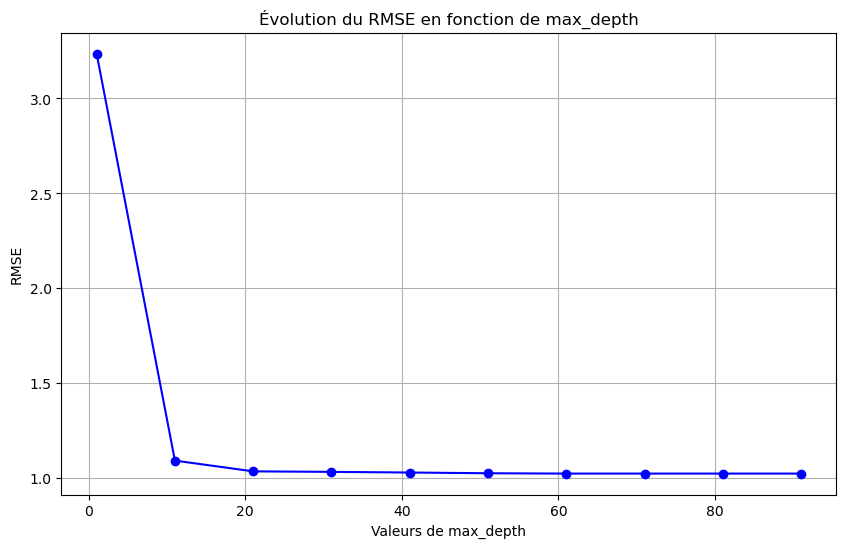

In [150]:
def plot_rmse_evolution(X, y, param_name, param_values):
    """
    Affiche l'évolution du RMSE en fonction des valeurs d'un hyperparamètre.

    Parameters:
    - X: DataFrame ou array des features.
    - y: Array ou Series des cibles.
    - param_name: Nom de l'hyperparamètre à tester (string, ex. 'n_estimators').
    - param_values: Liste des valeurs à tester pour l'hyperparamètre.
    """
    rmse_scores = []

    # Diviser les données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Tester chaque valeur de l'hyperparamètre
    for value in param_values:
        params = {param_name: value, 'n_estimators': 65,'min_samples_split':2, 'max_features':56, 'min_samples_leaf':1 }
        clf = RandomForestRegressor(**params, random_state=42, n_jobs=-1)
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        rmse_scores.append(rmse)

    # Plot des résultats
    plt.figure(figsize=(10, 6))
    plt.plot(param_values, rmse_scores, marker='o', linestyle='-', color='blue')
    plt.title(f"Évolution du RMSE en fonction de {param_name}")
    plt.xlabel(f"Valeurs de {param_name}")
    plt.ylabel("RMSE")
    plt.grid()
    plt.show()
    
param_values = np.arange(1, 100, 10).tolist()  # Liste des valeurs de max_features
plot_rmse_evolution(X_train, y_train, param_name='max_depth', param_values=param_values)


In [182]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Supposons que Donnée_entrainement contienne toutes les données nécessaires
# Suppression des colonnes inutiles pour l'entraînement
X = Donnée_entrainement.drop(['ID', 'persistent_id', 'day', 'prediction_type', 'target'], axis=1).fillna(0)

# Cible (variable à prédire)
y = Donnée_entrainement['target']

# Découpage des données entre ensemble d'apprentissage et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialisation du modèle
clf2 = RandomForestRegressor(n_estimators = 65 , min_samples_split = 2,  max_features = 56,  min_samples_leaf = 1,max_depth= 30 ,random_state=42,n_jobs=-1)

# Entraînement du modèle
clf2.fit(X_train, y_train)

# Prédictions sur l'ensemble de test
y_pred = clf2.predict(X_test)

# Évaluation de la performance avec RMSE
rmse_score = mean_squared_error(y_test, y_pred, squared=False)
print(f'RMSE Score: {rmse_score}')

p = rmse_score/y_pred.mean()
p



RMSE Score: 0.9512746773464004


0.09673615689322526

In [184]:
# Suppression des colonnes inutiles dans les données de test
X_test = Donnée_de_test.drop(['ID', 'persistent_id', 'day', 'prediction_type'], axis=1).fillna(0)
# Prédictions sur les données de test
prediction = clf2.predict(X_test)
# Sauvegarde ou affichage des prédictions
print("Predictions on Test Data:")
print(prediction)

# Si vous voulez sauvegarder les prédictions dans un fichier ou un DataFrame :

sub_file = pd.DataFrame({'ID': Donnée_de_test.ID, 'target': prediction})
sub_file.head(100)


Predictions on Test Data:
[2.04336125 2.04336125 3.77019182 ... 3.77019182 3.77019182 3.20328257]


,ID,target
0,ID_12774757194929362944_X_other_weekday_X_evening_rush_hour,2.04336
1,ID_17452592308638134272_X_second_weekday_X_evening_rush_hour,2.04336
2,ID_8237703473311684608_X_second_weekday_X_morning_rush_hour,3.77019
3,ID_3015566756887842816_X_other_holiday_X_morning_rush_hour,3.77019
4,ID_4713959480415053824_X_lbo_weekday_X_evening_rush_hour,6.39120
5,ID_6191872129374323712_X_second_weekday_X_morning_rush_hour,3.77019
6,ID_8130806669401953280_X_first_holiday_X_morning_rush_hour,3.77019
7,ID_1695636919003138816_X_first_holiday_X_evening_rush_hour,6.20021
8,ID_1840073079562101248_X_lbo_weekday_X_morning_rush_hour,3.77019
9,ID_15905747566887690240_X_first_holiday_X_evening_rush_hour,2.04336


In [168]:
sub_file.to_csv("submission.csv", index=False)
print("Fichier de soumission sauvegardé : submission.csv")

Fichier de soumission sauvegardé : submission.csv


In [186]:
sub_file.target.mean()

3.9631028517152056

In [188]:
sub_file.target.max()

8.464162069117219